# Estimating Lithium-ion Battery Health

### Introduction to Lithium-based batteries, their cycles characteristics and aging

Lithium-ion (or Li-ion) batteries are rechargeable batteries used for a variety of electronic devices, which range from eletric vehicles, smartphones, and even satellites.

However, despite their wide adoption, research isn't mature enough to avoid problems with battery health and safety, and given the ubiquity of consumer electronics using the technology, this has led to some poor outcomes that range from poor user-experience to public safety concerns (see, for example, the Samsung Galaxy Note 7 explosions from 2016).

### Dataset

In this example of **predictive maintenance**, we propose a data-driven method to estimate the health of a battery using the [Li-ion battery dataset](https://ti.arc.nasa.gov/tech/dash/groups/pcoe/prognostic-data-repository/) released by NASA ([csv](../../data/battery5_data.zip)).

This dataset includes information on Li-ion batteries over several charge and discharge cycles at room temperature. Charging was at a constant current (CC) at 1.5A until the battery voltage reached 4.2V and then continued in a constant voltage (CV) mode until the charge current dropped to 20mA. Discharge was at a constant current (CC) level of 2A until the battery voltage fell to 2.7V.

You can download the Jupyter notebook of this study <a href="battery.ipynb">here</a>.

The dataset includes the following:
<ul class="ul_content">
<li><b>Voltage_measured</b>: Battery's terminal voltage (Volts) for charging and discharging cycles</li>
<li><b>Current_measured</b>: Battery's output current (Amps) for charging and discharging cycles</li>
<li><b>Temperature_measured</b>: Battery temperature (degree Celsius)</li>
<li><b>Current_charge</b>: Current measured at charger for charging cycles and at load for discharging cycles (Amps)</li>
<li><b>Voltage_charge</b>: Voltage measured at charger for charging cycles and at load for discharging ones (Volts)</li>
<li><b>Start_time</b>: Starting time of the cycle</li>
<li><b>Time</b>: Time in seconds after the starting time for the cycle (seconds)</li>
<li><b>Capacity</b>: Battery capacity (Ahr) for discharging until 2.7V. Battery capacity is the product of the current drawn from the battery (while the battery is able to supply the load) until its voltage drops lower than a certain value for each cell.</li>
</ul>

### Initialization

This example uses the following version of VerticaPy:

In [1]:
import verticapy as vp
vp.__version__

'1.0.1'

Connect to Vertica. This example uses an existing connection called "VerticaDSN." For details on how to create a connection, use see the <a href="https://www.vertica.com/python/documentation/1.0.x/html/connection.html">connection tutorial</a>.

You can skip the below cell if you already have an established connection.

In [2]:
vp.connect("VerticaDSN")

Before we import the data, we'll drop any existing schemas of the same name.

In [2]:
vp.drop("battery_data", method="schema")
vp.create_schema("battery_data", True)

True

Since our data is in a .csv file, we'll injest it with <a href="../../documentation_last/utilities/read_csv/">read_csv()</a>.

In [3]:
battery5 = vp.read_csv("data/data.csv")

## Understanding the Data

Let's examine our data. Here, we use vDataFrame.<a href="../../documentation_last/vdataframe/main-methods/head/">head()</a> to retrieve the first five rows of the dataset.

,123Voltage_measuredFloat(22),123Current_measuredFloat(22),123Temperature_measuredFloat(22),123Current_chargeNumeric(11),123Voltage_chargeNumeric(10),123TimeFloat(22),AbctypeVarchar(20),📅start_timeTimestamp(29),123ambient_tempInteger,123CapacityFloat(22)
1,0.00336524422388181,-0.00149573390003958,23.369433909575,0.0,0.003,2.547,charge,2008-05-28 11:09:42.000045,24,[null]
2,0.236356184152679,-0.00348442627618414,23.3720475048121,0.0,0.003,0.0,charge,2008-05-28 11:09:42.000045,24,[null]
3,2.45567932466456,-2.01259011577148,38.418742770556,-1.9982,1.685,3250.766,discharge,2008-04-05 22:46:35.000484,24,1.8027776247196
4,2.47131476433413,-2.01438891947297,38.0765742576909,-1.9982,1.695,3270.922,discharge,2008-04-20 15:37:05.000280,24,1.81396938871035
5,2.47244830185273,-2.00928251876441,38.4230398541122,-1.9982,1.684,3290.234,discharge,2008-04-04 09:57:19.000765,24,1.82461955268645

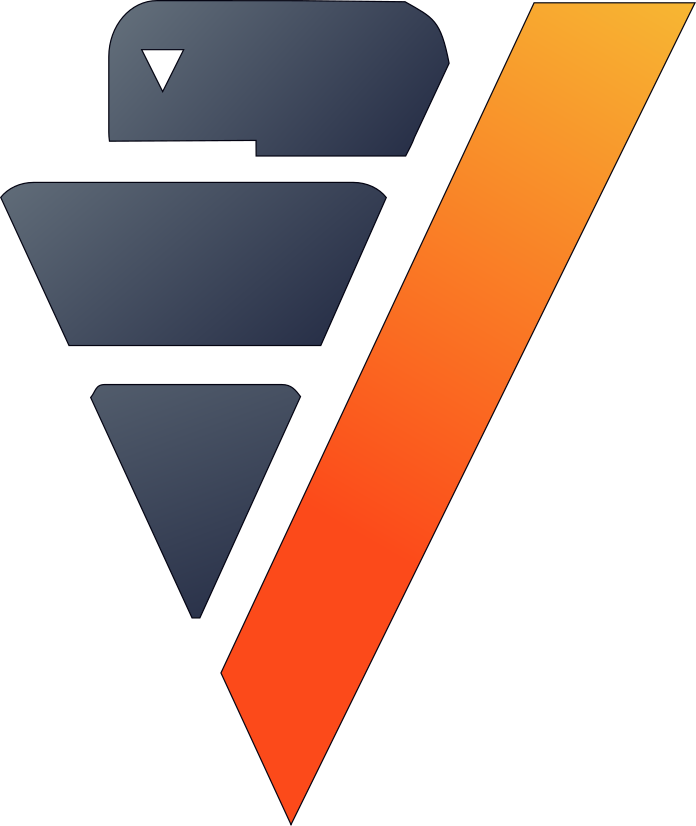

In [4]:
display(battery5.head(5))

Let's perform a few aggregations with vDataFrame.<a href="../../documentation_last/vdataframe/main-methods/describe/">describe()</a> to get a high-level overview of the dataset.

,count,mean,std,min,approx_25%,approx_50%,approx_75%,max
"""Voltage_measured""",591458,4.10394503838216,0.213468670467274,0.00336524422388181,4.09245383862896,4.20514634291663,4.20591030583614,8.39314118056463
"""Current_measured""",591458,0.369404334640848,0.907557734956734,-4.4796596195982,0.0439937835399117,0.171124614960713,1.21885810657857,1.53130142697453
"""Temperature_measured""",591458,26.3697006309627,2.77242440009329,23.2148017857281,24.4903992949438,25.4773176390203,27.357547074662,41.4502319190386
"""Current_charge""",591458,0.634475697682678,0.737028608855502,-4.468,0.057,0.261,1.498,1.9984
"""Voltage_charge""",591458,4.02493041771349,1.20882522698251,0.0,4.24,4.305,4.656,5.002
"""Time""",591458,4763.85693356587,3147.85902580761,0.0,1926.17347403133,4486.12800123102,7525.33668945761,10807.328
"""ambient_temp""",591458,24.0,0.0,24.0,24.0,24.0,24.0,24.0
"""Capacity""",50285,1.5603447176546,0.182379527870387,1.28745252213794,1.38622876779783,1.53823659894256,1.74687061798379,1.85648742081816

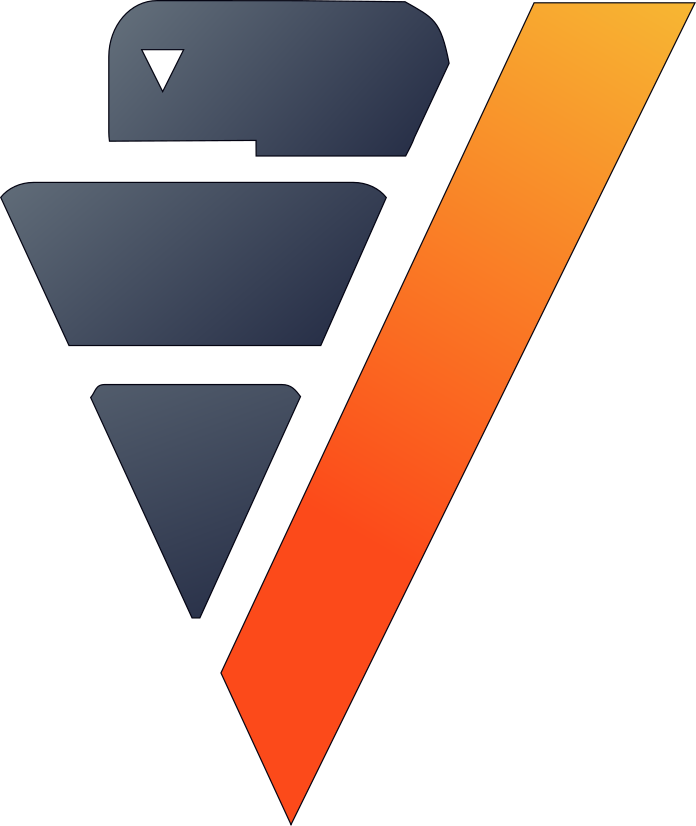

In [5]:
battery5.describe()

To get a better idea of the changes between each cycle, we look at an aggregation at their start time, duration, and voltage at the beginning and the end of each cycle.

,value
name,"""start_time"""
dtype,timestamp
count,591458
min,2008-04-02 13:08:17.000920
max,2008-05-28 11:09:42.000045

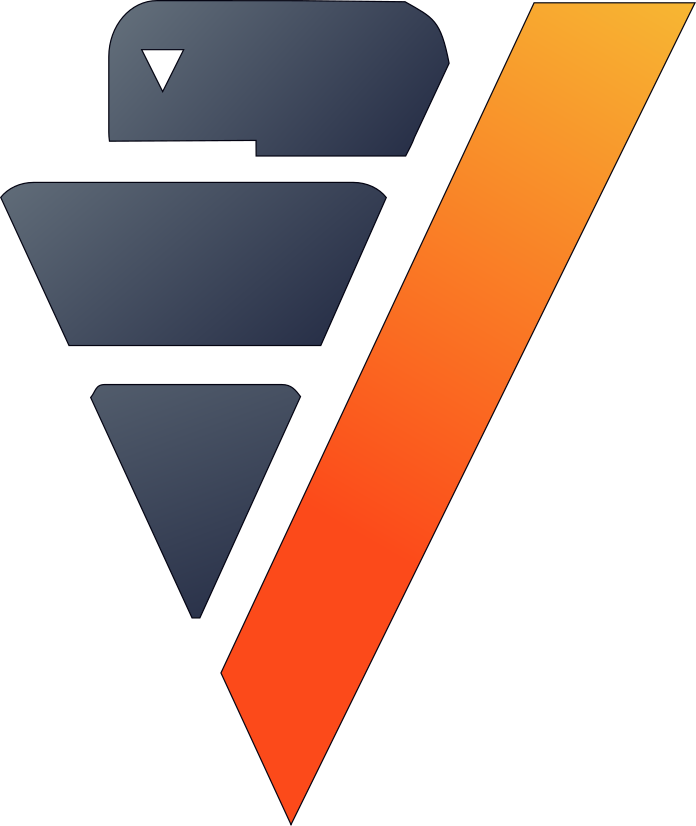

In [6]:
battery5['start_time'].describe()

To see how the voltage changes during the cycle, we extract the initial and final voltage measurements for each cycle.

,📅start_timeTimestamp(29),AbctypeVarchar(20),123first_voltage_measuredFloat(22),123last_voltage_measuredFloat(22),123nr_of_measurementsInteger,123cycle_durationFloat(22),123cycle_idInteger
1,2008-04-02 13:08:17.000920,charge,3.873017221301,4.191077562802,789,7597.875,1
2,2008-04-02 15:25:41.000593,discharge,4.19149180750529,3.2771699768252,197,3690.234,2
3,2008-04-02 16:37:51.000984,charge,3.32505465684485,4.18906184108551,940,10516.0,3
4,2008-04-02 19:43:48.000405,discharge,4.18977321384661,3.30024488712225,196,3672.344,4
5,2008-04-02 20:55:40.000811,charge,3.35260365999878,4.18739822580616,937,10484.547,5
6,2008-04-03 00:01:06.000687,discharge,4.1881867359913,3.32745100986863,195,3651.641,6
7,2008-04-03 01:12:38.000670,charge,3.37879897651295,4.18805495607423,933,10397.89,7
8,2008-04-03 04:16:37.000375,discharge,4.18846111885557,3.31418185890703,194,3631.563,8
9,2008-04-03 05:27:49.000125,charge,3.37287091743927,4.18843843091541,937,10495.203,9
10,2008-04-03 08:33:25.000702,discharge,4.18829852476105,3.30549673128648,194,3629.172,10

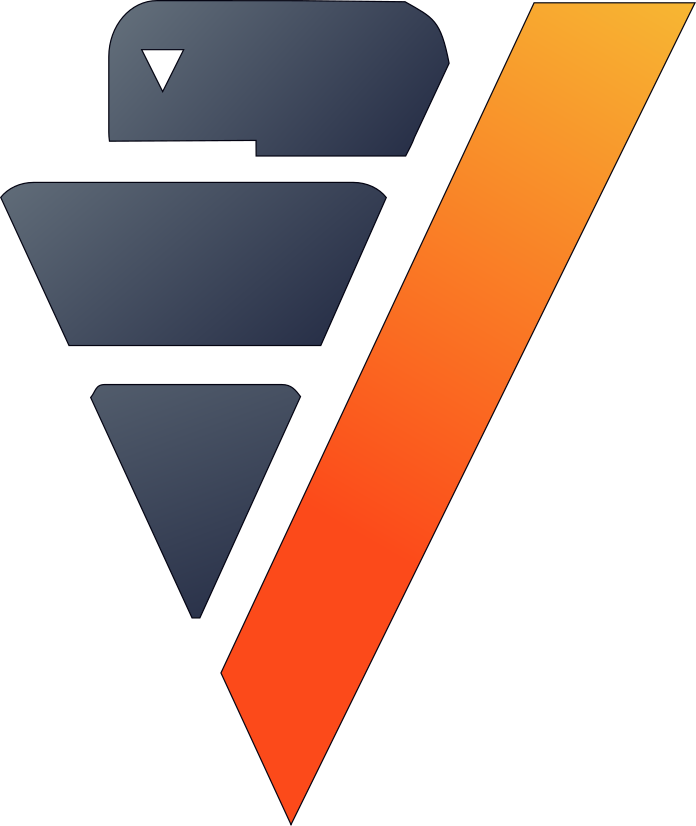

In [7]:
battery5.analytic(func="first_value",
                  columns="Voltage_measured",
                  by="start_time",
                  order_by={"Time":"asc"},
                  name="first_voltage_measured")

battery5.analytic(func="first_value",
                  columns="Voltage_measured",
                  by="start_time",
                  order_by={"Time":"desc"},
                  name="last_voltage_measured")

cycling_info = battery5.groupby(columns = ['start_time',
                                           'type',
                                           'first_voltage_measured',
                                           'last_voltage_measured'], 
                                expr = ["COUNT(*) AS nr_of_measurements",
                                        "MAX(Time) AS cycle_duration"]).sort('start_time')
cycling_info['cycle_id'] = "ROW_NUMBER() OVER(ORDER BY start_time)"
cycling_info

We can see from the "duration" column that charging seems to take a longer time than discharging. Let's visualize this trend with an animated graph.

In [8]:
import warnings
warnings.filterwarnings('ignore')
cycling_info.animated_bar(
    ts="start_time",
    columns= ["type","cycle_duration"]
)

The animated graph below shows how the cycles change throughout time. Another way we can verify that charging cycles are longer than discharging cycles is by looking at the average duration of each type of cycle.

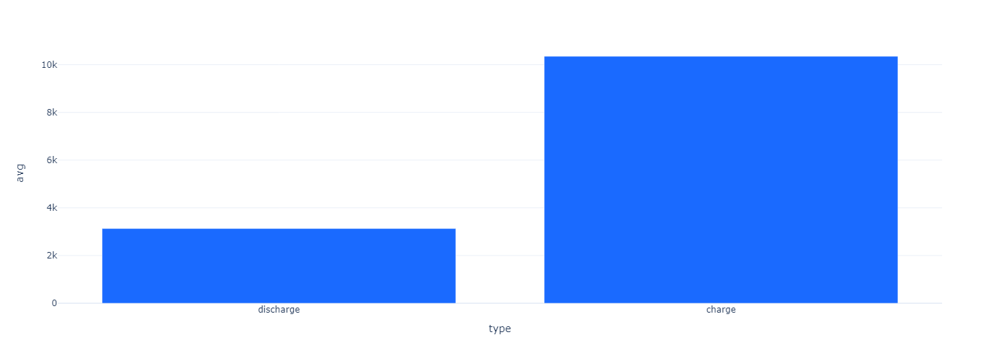

In [9]:
cycling_info.bar(["type"], 
                 method = "avg", 
                 of = "cycle_duration")

In general, charging cycles are longer than discharging cycles. Let's examine how voltage changes between cycles and their transitions.

,AbctypeVarchar(20),123min_first_voltageFloat(22),123avg_first_voltageFloat(22),123max_first_voltageFloat(22),123min_last_voltageFloat(22),123avg_last_voltageFloat(22),123max_last_voltageFloat(22)
1,discharge,4.18453480301131,4.19597100862757,4.22292005793579,3.20506891560499,3.4713048542903,3.6211910328537
2,charge,0.236356184152679,3.62261106314154,8.39314118056463,4.18725399564513,4.1986688743734,4.21343968400049

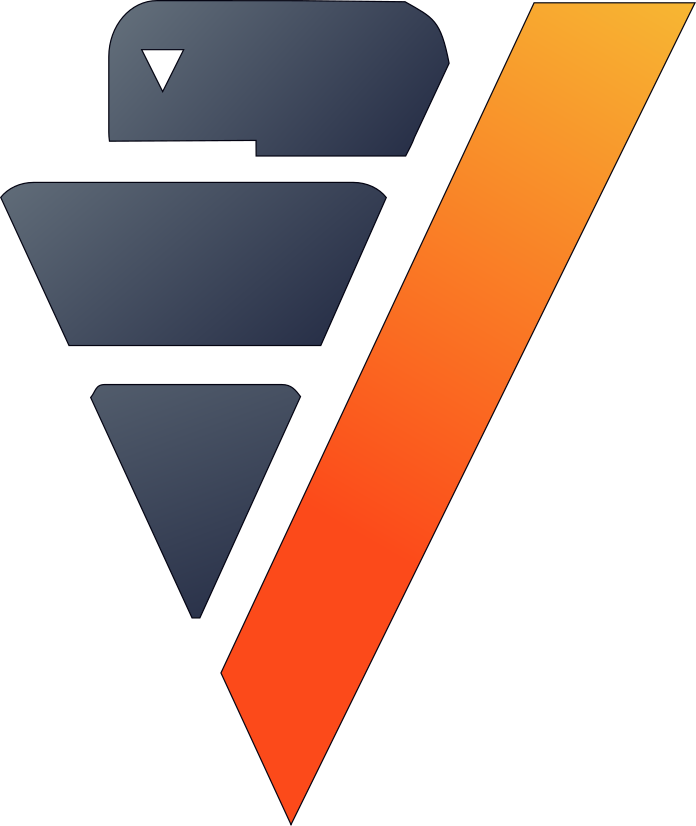

In [10]:
cycling_info.groupby('type',['MIN(first_voltage_measured) AS min_first_voltage',
                             'AVG(first_voltage_measured) AS avg_first_voltage',
                             'MAX(first_voltage_measured) AS max_first_voltage',
                             'MIN(last_voltage_measured)  AS min_last_voltage',
                             'AVG(last_voltage_measured)  AS avg_last_voltage',
                             'MAX(last_voltage_measured)  AS max_last_voltage'])

From this table, it looks like batteries are charged until they are almost full (4.2V) and discharging doesn't begin until they are fully charged.

End-of-life (EOL) criteria for batteries is usually defined as when the battery capacity is lower than 70%-80% of its rated capacity. Since the rated capacity by the manufacturer for this battery is 2Ah, this battery is considered EOL when its capacity reaches 2Ah x 70% = 1.4Ah.

Let's plot the capacity curve of the battery with its smoothed version and observe when it reaches the degradation criteria. But first we need to perform some preprocessing.

,📅start_timeTimestamp(29),123CapacityFloat(22),123discharge_idInteger,123smooth_capacityFloat(22)
1,2008-05-26 20:21:04.000921,1.28745252213794,166,[null]
2,2008-05-26 15:30:43.000968,1.28800339261912,165,1.28745252213794
3,2008-05-26 10:44:38.000468,1.29346361384424,164,1.28772795737853
4,2008-05-26 01:13:02.000796,1.29788708064957,162,1.2896398428671
5,2008-05-26 06:01:08.000170,1.29807350569189,163,1.29170165231272
6,2008-05-25 10:51:37.000015,1.30303291864059,159,1.29297602298855
7,2008-05-25 15:37:08.000890,1.30335735590382,160,1.29465217226389
8,2008-05-25 20:23:04.000453,1.30341004386556,161,1.29589576992674
9,2008-05-25 05:57:17.000890,1.30779599469444,158,1.29683505416909
10,2008-05-27 15:52:41.000359,1.30901536423074,167,1.29805293644969

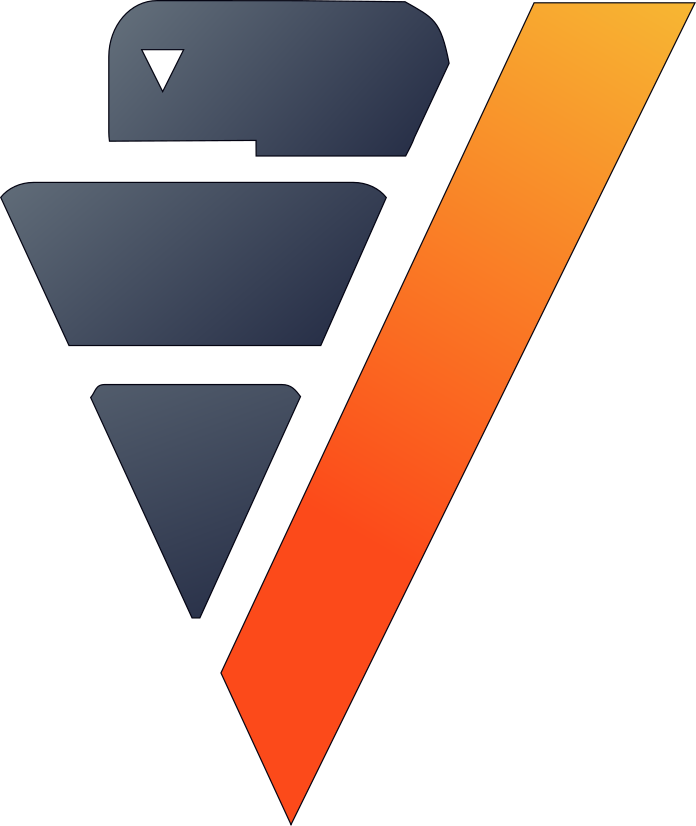

In [11]:
# Visualize the capacity degradation curve along with its smoothed version
discharging_data = battery5[battery5['type'] == 'discharge']
d_cap = discharging_data[['start_time', 'Capacity']].groupby(['start_time', 'Capacity'])
d_cap["discharge_id"] = "ROW_NUMBER() OVER(ORDER BY start_time, Capacity)"
d_cap.rolling(func = 'mean',
              columns = 'capacity',
              window = (-100, -1),
              name = 'smooth_capacity')

Now we can plot the graphs. In VerticaPy we have multiple options to plot the graphs with different syntax of customization. For a complete list of all the graphs and their options check out the [Chart Gallery](https://www.vertica.com/python/documentation/1.0.x/html/chart_gallery.html).

Now let's first try to plot this using Matplotlib:

<Figure size 640x480 with 0 Axes>

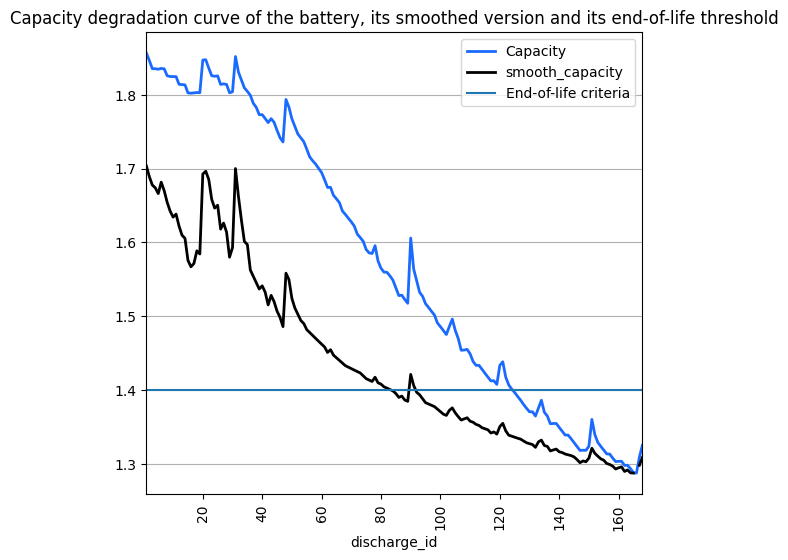

In [12]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import axhline

# Switch the plotting library to Matplotlib
vp.set_option("plotting_lib", "matplotlib")

fig = plt.figure()
ax = d_cap.plot(ts = 'discharge_id', columns = ['Capacity', 'smooth_capacity'])
ax.axhline(y=1.4, label='End-of-life criteria')
ax.set_title('Capacity degradation curve of the battery, its smoothed version and its end-of-life threshold')
ax.legend() 
plt.show()

We can now try to plot it using Plotly. We can conveniently switch between the plotting libraries using:

In [13]:
# Switch the plotting library to Plotly
vp.set_option("plotting_lib", "plotly")

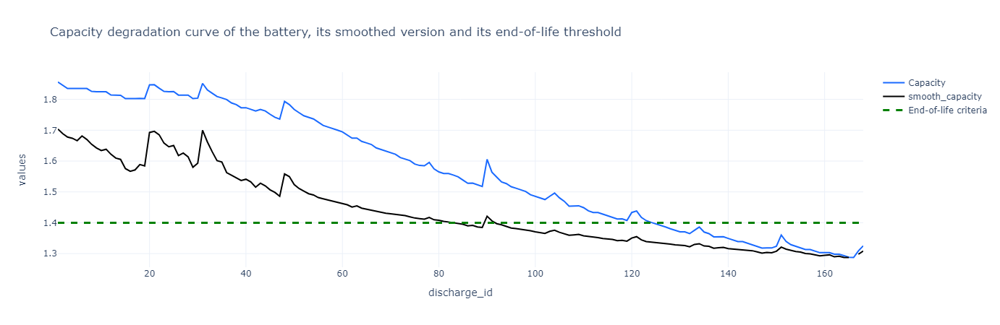

In [14]:
import plotly.graph_objects as go
plot = d_cap.plot(ts = 'discharge_id', columns = ['Capacity', 'smooth_capacity'], title = "Capacity degradation curve of the battery, its smoothed version and its end-of-life threshold")
# Add horizontal line
plot.add_hline(y=1.4, line_width=3, line_dash="dash", line_color="green")
# Add legend for the horizontal line
plot.add_trace(go.Scatter(x=[None], y=[None], mode='lines', line=dict(color="green", width=3, dash="dash"), name='End-of-life criteria'))

The sudden increases in battery capacity come from the self-charging property of Li-ion batteries. The smoothed graph makes the downward trend in the battery's capacity very clear.

An important observation here is that the battery meets the EOL criteria around the 125th cycle.

## Goal and Problem Modeling

Understanding battery health is important, but at the time of writing, there's no direct way to measure it. In our case, we'll create a degredation model to find the relationship between a battery's overall health and the other properties in the dataset, which includes charge and discharge cycle duration, average voltage and current, etc.

One possible definition of the battery's overall health ("state of health" or "SoH") is the following:

Let 
 
be the rated capacity of the battery when its new (2Ah in our case),
   and  be the actual capacity of the battery at specific time. The
state of health of the battery is defined as:
    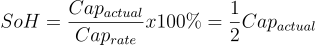


In order to find this relationship, we'll clean and prepare our data by adding some extra features. These extra features will help us understand how the battery behaves during and between each cycle and pinpoint what might be the primary causes for battery degredation.

## Data Preparation

### Outlier detection

Let's start by finding and removing the global outliers from our dataset.

7803 elements were filtered.


,123Voltage_measuredFloat(22),123Current_measuredFloat(22),123Temperature_measuredFloat(22),123Current_chargeNumeric(11),123Voltage_chargeNumeric(10),123TimeFloat(22),AbctypeVarchar(20),📅start_timeTimestamp(29),123ambient_tempInteger,123CapacityFloat(22),123first_voltage_measuredFloat(22),123last_voltage_measuredFloat(22)
1,3.2771699768252,-0.00652835125160699,34.230852841541,-0.0006,0.0,3690.234,discharge,2008-04-02 15:25:41.000593,24,1.85648742081816,4.19149180750529,3.2771699768252
2,3.27320673224271,-0.000387595838485931,34.4900784794945,-0.0006,0.0,3669.875,discharge,2008-04-02 15:25:41.000593,24,1.85648742081816,4.19149180750529,3.2771699768252
3,3.26902995262555,-0.000405677789241946,34.7548714196558,-0.0006,0.0,3649.375,discharge,2008-04-02 15:25:41.000593,24,1.85648742081816,4.19149180750529,3.2771699768252
4,3.26412058058012,-0.0015316912571288,35.0217378011417,-0.0006,0.0,3628.953,discharge,2008-04-02 15:25:41.000593,24,1.85648742081816,4.19149180750529,3.2771699768252
5,3.25870451344492,-0.00151257983033383,35.2967112267174,-0.0006,0.0,3608.594,discharge,2008-04-02 15:25:41.000593,24,1.85648742081816,4.19149180750529,3.2771699768252
6,3.25261433963303,-0.00265918084987476,35.5858439354707,-0.0004,0.0,3588.328,discharge,2008-04-02 15:25:41.000593,24,1.85648742081816,4.19149180750529,3.2771699768252
7,3.25451646129461,-2.01109019781861,37.1810726027764,-1.9982,2.346,3131.234,discharge,2008-04-02 15:25:41.000593,24,1.85648742081816,4.19149180750529,3.2771699768252
8,3.27371569393002,-2.01231137821328,37.0692161840065,-1.9982,2.364,3111.828,discharge,2008-04-02 15:25:41.000593,24,1.85648742081816,4.19149180750529,3.2771699768252
9,3.29037736566309,-2.01101273322598,36.9759823697988,-1.9982,2.38,3092.328,discharge,2008-04-02 15:25:41.000593,24,1.85648742081816,4.19149180750529,3.2771699768252
10,3.30494144277741,-2.01386694513532,36.8618549904158,-1.9982,2.394,3072.859,discharge,2008-04-02 15:25:41.000593,24,1.85648742081816,4.19149180750529,3.2771699768252

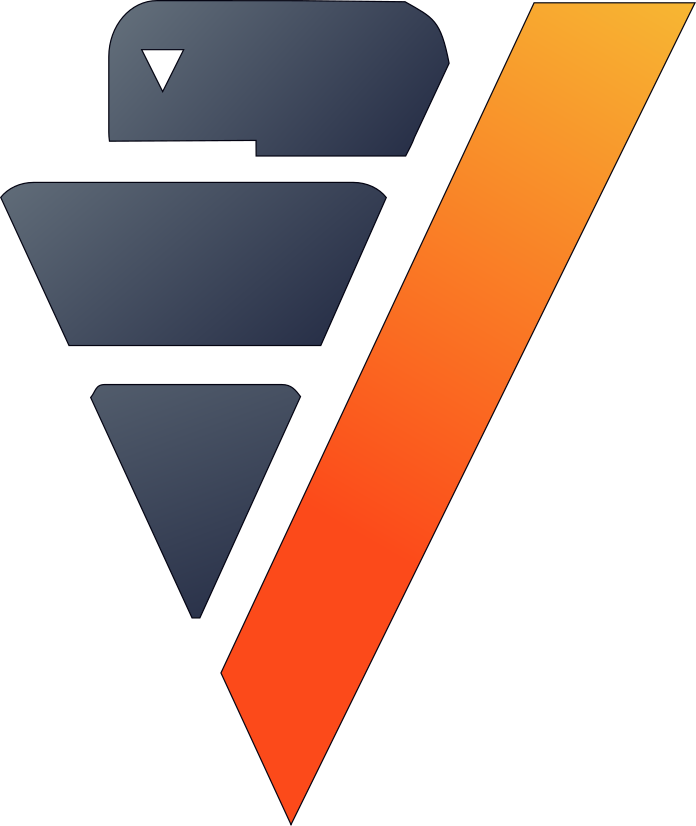

In [15]:
battery5.outliers(columns = ["Voltage_measured","Current_measured","Temperature_measured","Capacity"],
                  name = "global_outlier",
                  threshold = 4.0)
battery5.filter("global_outlier = 0").drop('global_outlier')

## Feature engineering

Since measurements like voltage and temperature tend to differ within the different cycles, we'll create some features that can describe those cycles.

<AxesSubplot:xlabel='Time', ylabel='Voltage_measured'>

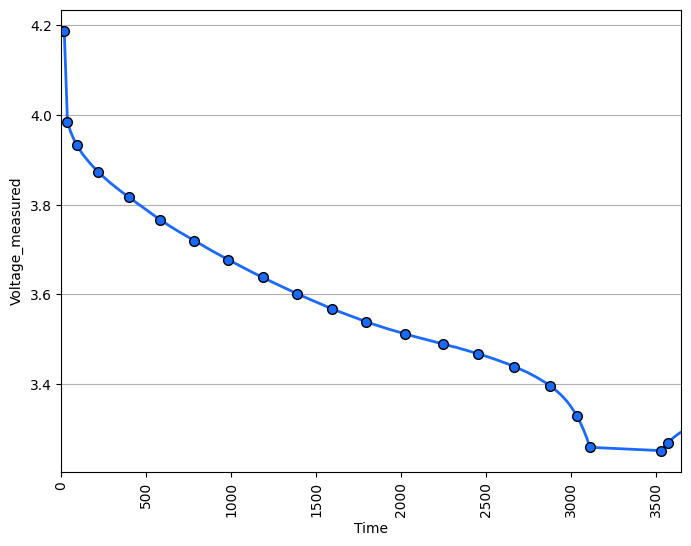

In [18]:
sample_cycle = battery5[battery5['Capacity'] == '1.83514614292266']
sample_cycle["Voltage_measured"].plot(ts = "Time")

<AxesSubplot:xlabel='Time', ylabel='Temperature_measured'>

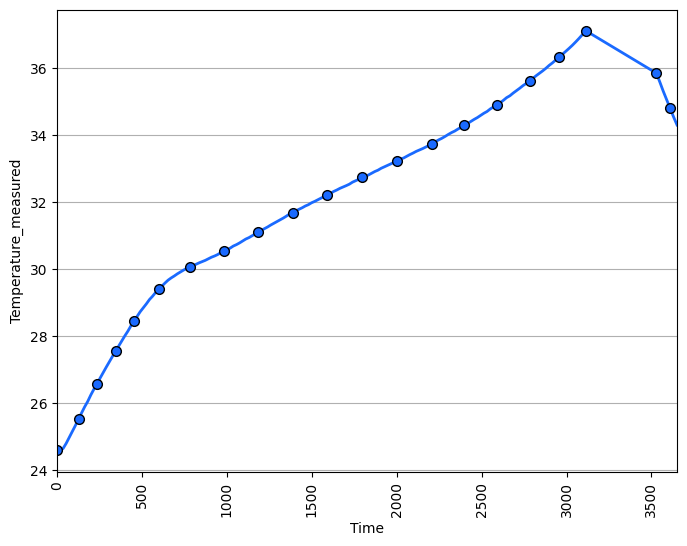

In [19]:
sample_cycle["Temperature_measured"].plot(ts = "Time")

We'll define new features that describe the minimum and maximum temperature during one cycle; the minimal voltage; and the time needed to reach minimum voltage and maximum temperature.

In [20]:
# filter for discharge cycles
discharging_data = battery5[battery5['type'] == 'discharge']


# define new features
discharge_cycle_metrics = discharging_data.groupby(columns = ['start_time'], 
                                                   expr = ['MIN(Temperature_measured) AS min_temp',
                                                           'MAX(Temperature_measured) AS max_temp',
                                                           'MIN(Voltage_measured) AS min_volt']).join(
                                                           discharging_data, 
                                                           how = "left",
                                                           on = {"min_volt":"voltage_measured"},
                                                           expr1 = ["*"],
                                                           expr2 = ["Time AS time_to_reach_minvolt"]).join(
                                                           discharging_data, 
                                                           how = "left",
                                                           on = {"max_temp":"temperature_measured"},
                                                           expr1 = ["*"],
                                                           expr2 = ["Time AS time_to_reach_maxtemp"])

# calculate values of SOH
discharging_data = discharging_data.groupby(['start_time','Capacity'])
discharging_data['SOH'] = discharging_data['Capacity'] * 0.5

,📅start_timeTimestamp(29),123min_tempFloat(22),123max_tempFloat(22),123min_voltFloat(22),123time_to_reach_minvoltFloat(22),123time_to_reach_maxtempFloat(22),123SOHFloat(22)
1,2008-04-02 15:25:41.000593,0.323719818945165,0.734249807626277,0.0139094927117295,1.0,0.828363213887708,0.92824371040908
2,2008-04-02 19:43:48.000405,0.428584253762227,0.914351158360577,0.00288513334234004,0.723648022938414,0.829373513631507,0.923163624859965
3,2008-04-03 00:01:06.000687,0.442660578483156,0.795738011577447,0.0531177643719836,0.927547868717847,0.815449759308832,0.917674597111705
4,2008-04-03 04:16:37.000375,0.418765254851753,0.661205504813534,0.053907085311971,0.712096944880247,0.815696769338588,0.917631263791055
5,2008-04-03 08:33:25.000702,0.379860520846069,0.54435119574023,0.0415520261704376,0.710988351889733,0.814384169529302,0.91732275410602
6,2008-04-03 12:55:10.000686,0.378615452772031,0.618246536336501,0.00994014897430571,0.952280165949336,0.815281735044404,0.917830830033775
7,2008-04-03 17:17:16.000015,0.396431419261175,0.673902853713857,0.0102850192996644,0.963925850411508,0.814619690720465,0.91757307146133
8,2008-04-03 21:28:14.000718,0.43597699765424,0.654370511378216,0.0279191282597782,0.712816802582512,0.816549097551729,0.912878395283275
9,2008-04-04 01:38:15.000217,0.411844366919643,0.509666695146447,0.0558933456651759,0.927841997602092,0.801548982663343,0.912386926494565
10,2008-04-04 05:48:08.000609,0.392346756721263,0.46136681915143,0.0626804878161233,0.940644184708088,0.801526723038568,0.91230663424847

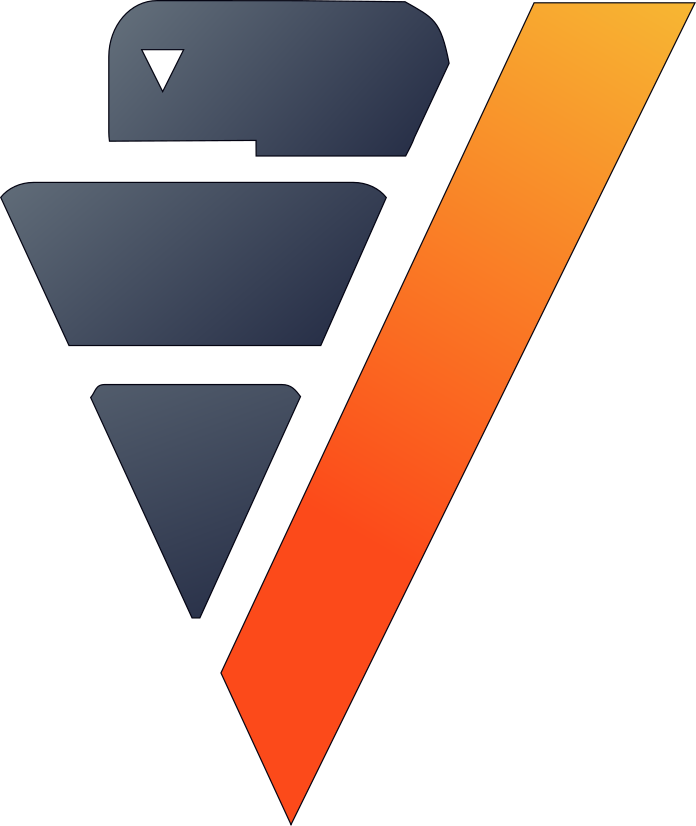

In [21]:
# define the final dataset and save it to db
final_df = discharge_cycle_metrics.join(discharging_data,
                     on_interpolate = {"start_time":"start_time"},
                     how = "left",
                     expr1 = ["*"],
                     expr2 = ["SOH AS SOH"])

# normalize the features
final_df.normalize(method = "minmax",
                   columns = ["min_temp",
                              "max_temp",
                              "min_volt",
                              "time_to_reach_minvolt",
                              "time_to_reach_maxtemp"])

# save it to db
final_df.to_db(name = "battery_data.finaldata_battery_5")

## Machine Learning

<a href="../../documentation_last/delphi/automl/">AutoML</a> tests several models and returns input scores for each. We can use this to find the best model for our dataset.

In [ ]:
from verticapy.machine_learning.vertica.automl import AutoML

model = AutoML("battery_data.battery_autoML", 
               estimator = "native")
model.fit("battery_data.finaldata_battery_5", 
          X = ["min_temp",
               "max_temp",
               "min_volt",
               "time_to_reach_minvolt",
               "time_to_reach_maxtemp"],
          y = "SOH")

Starting AutoML



  0%|          | 0/7 [00:00<?, ?it/s]


Testing Model - LinearRegression



  0%|          | 0/2 [00:00<?, ?it/s]

Model: LinearRegression; Parameters: {'tol': 1e-06, 'max_iter': 100, 'solver': 'newton'}; Test_score: 0.019618785067447433; Train_score: 0.0185627921133221; Time: 0.14327502250671387;
Model: LinearRegression; Parameters: {'tol': 1e-06, 'max_iter': 100, 'solver': 'bfgs'}; Test_score: 0.02136511236744143; Train_score: 0.0177664019946593; Time: 0.39633893966674805;
Grid Search Selected Model
LinearRegression; Parameters: {'tol': 1e-06, 'max_iter': 100, 'solver': 'newton', 'fit_intercept': True}; Test_score: 0.019618785067447433; Train_score: 0.0185627921133221; Time: 0.14327502250671387;

Testing Model - ElasticNet



  0%|          | 0/2 [00:00<?, ?it/s]

Model: ElasticNet; Parameters: {'tol': 1e-06, 'max_iter': 100, 'solver': 'cgd', 'C': 1.0, 'l1_ratio': 0.5}; Test_score: 0.09636677772299666; Train_score: 0.09450938623981812; Time: 0.17826596895853677;
Grid Search Selected Model
ElasticNet; Parameters: {'tol': 1e-06, 'C': 1.0, 'max_iter': 100, 'solver': 'cgd', 'l1_ratio': 0.5, 'fit_intercept': True}; Test_score: 0.09636677772299666; Train_score: 0.09450938623981812; Time: 0.17826596895853677;

Testing Model - Ridge



  0%|          | 0/1 [00:00<?, ?it/s]

Model: Ridge; Parameters: {'tol': 1e-06, 'max_iter': 100, 'C': 1.0}; Test_score: 0.0171575156112569; Train_score: 0.020064940846231265; Time: 0.1346567471822103;
Grid Search Selected Model
Ridge; Parameters: {'tol': 1e-06, 'C': 1.0, 'max_iter': 100, 'solver': 'newton', 'fit_intercept': True}; Test_score: 0.0171575156112569; Train_score: 0.020064940846231265; Time: 0.1346567471822103;

Testing Model - Lasso



  0%|          | 0/2 [00:00<?, ?it/s]

Model: Lasso; Parameters: {'tol': 1e-06, 'max_iter': 100, 'solver': 'cgd', 'C': 1.0}; Test_score: 0.09654825213106853; Train_score: 0.09438629254341757; Time: 0.1739180088043213;
Grid Search Selected Model
Lasso; Parameters: {'tol': 1e-06, 'C': 1.0, 'max_iter': 100, 'solver': 'cgd', 'fit_intercept': True}; Test_score: 0.09654825213106853; Train_score: 0.09438629254341757; Time: 0.1739180088043213;

Testing Model - XGBRegressor



  0%|          | 0/5 [00:00<?, ?it/s]

Model: XGBRegressor; Parameters: {'nbins': 32, 'max_depth': 3, 'weight_reg': 0.25, 'min_split_loss': 0.0, 'learning_rate': 0.1, 'tol': 1e-08, 'max_ntree': 20}; Test_score: 0.016422420032050168; Train_score: 0.016042815403612767; Time: 1.858263333638509;
Model: XGBRegressor; Parameters: {'nbins': 32, 'max_depth': 4, 'weight_reg': 0.0, 'min_split_loss': 0.0, 'learning_rate': 0.05, 'tol': 1e-08, 'max_ntree': 20}; Test_score: 0.036082512106129734; Train_score: 0.034853176081598373; Time: 1.935727596282959;
Model: XGBRegressor; Parameters: {'nbins': 32, 'max_depth': 4, 'weight_reg': 0.0, 'min_split_loss': 0.0, 'learning_rate': 1.0, 'tol': 1e-08, 'max_ntree': 20}; Test_score: 0.012098989094025653; Train_score: 0.0014456533113897368; Time: 2.054535706837972;
Model: XGBRegressor; Parameters: {'nbins': 32, 'max_depth': 3, 'weight_reg': 0.0, 'min_split_loss': 0.0, 'learning_rate': 1.0, 'tol': 1e-08, 'max_ntree': 20}; Test_score: 0.018999125978948567; Train_score: 0.004616241252904871; Time: 1.94

  0%|          | 0/4 [00:00<?, ?it/s]

Model: LinearSVR; Parameters: {'tol': 1e-06, 'intercept_mode': 'regularized', 'max_iter': 100}; Test_score: 0.09737763846966613; Train_score: 0.09860397175246471; Time: 3.1302568912506104;
Model: LinearSVR; Parameters: {'tol': 1e-06, 'intercept_mode': 'unregularized', 'max_iter': 100}; Test_score: 0.06816414958915383; Train_score: 0.06631981187569984; Time: 3.332390069961548;
Model: LinearSVR; Parameters: {'tol': 1e-06, 'C': 1.0, 'intercept_mode': 'regularized', 'max_iter': 100}; Test_score: 0.09866658688356904; Train_score: 0.09831113146891546; Time: 2.744848887125651;


We can visualize the performance and efficency differences of each model with a plot.

<AxesSubplot:xlabel='time', ylabel='score'>

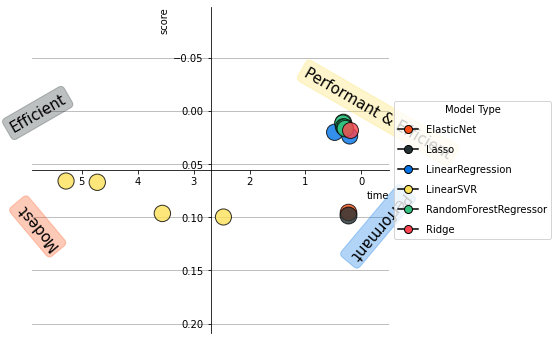

In [30]:
model.plot()

Let's check the type and hyperparameters of the most performant model.

In [31]:
# take the best model and its parameters
best_model = model.best_model_
params = best_model.get_params()
print(best_model.type)

RandomForestRegressor


We can now define the model using those hyperparameters and train it.

,value
explained_variance,0.997659518246552
max_error,0.0375041491629448
median_absolute_error,0.00184377468342722
mean_absolute_error,0.00278192359172081
mean_squared_error,2.11456072683787e-05
root_mean_squared_error,0.004598435306534028
r2,0.997653174398044
r2_adj,0.9975807415090947
aic,-1795.8434267288283
bic,-1777.6213819828436

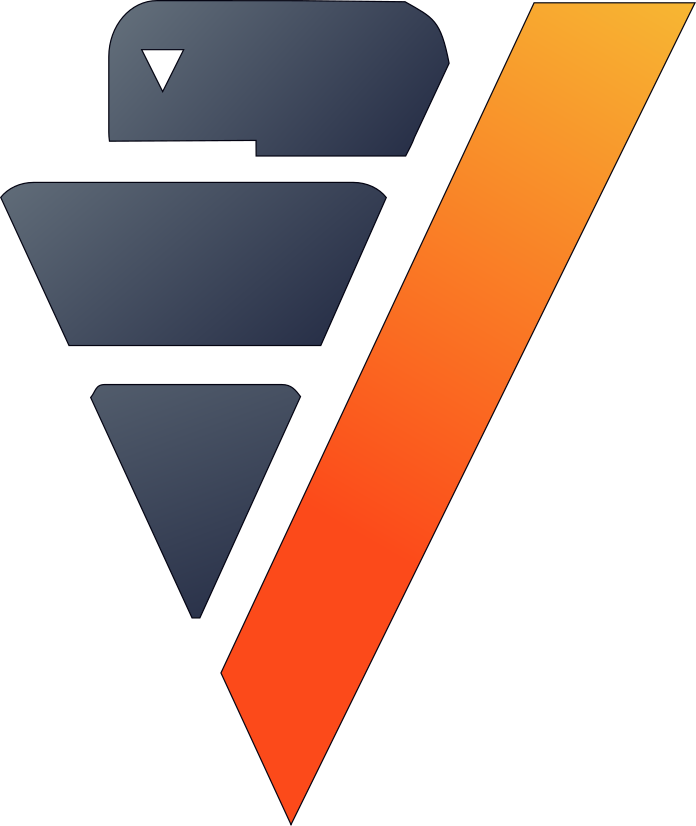

In [32]:
from verticapy.learn.ensemble import RandomForestRegressor

# define a regression model based on the selected parameters
model_rf = RandomForestRegressor(name = "btr_rf1", **params)
model_rf.fit(final_df,
             X = ["min_temp",
                  "max_temp",
                  "min_volt",
                  "time_to_reach_minvolt",
                  "time_to_reach_maxtemp"],
             y = "SOH")
model_rf.regression_report()

The predictive power of our model looks pretty good. Let's use our model to predict the SoH of the battery. We can visualize our prediction with a plot against the true values.

<AxesSubplot:xlabel='"start_time"'>

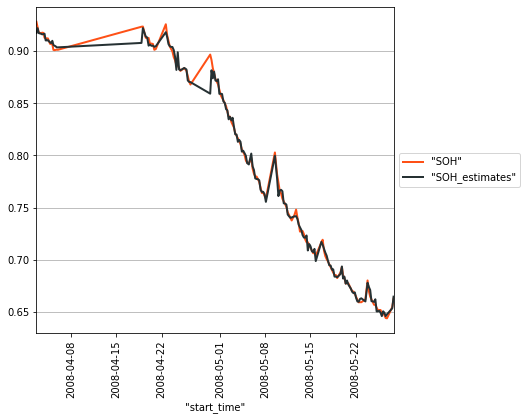

In [33]:
# take the predicted values and the plot them along the true ones
result = model_rf.predict(final_df, 
                          name = "SOH_estimates")
result.plot(ts = 'start_time', 
            columns = ['SOH', 'SOH_estimates'])

### Conclusion

We successfully defined a battery degradation model that can make accurate predictions about the health of a Li-ion battery. This model could be used to, for example, accurately send warnings to users when their batteries meet the EOL criteria.